## HDT2 
Autores:
- Mark Albrand
- Jimena Hernández 

## Parte 1 – Análisis exploratorio de datos

In [206]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [207]:
datos = pd.read_csv('Baseball.csv')
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,field_type,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,other_info_string,start_time,venue
0,"40,030']",New York Mets,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,"Sunday, April 3, 2016",NaN,: 3:13,"Night Game, on grass",Kansas City Royals,0,9,4,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:38 p.m. Local,: Kauffman Stadium
1,"21,621']",Philadelphia Phillies,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,"Wednesday, April 6, 2016",NaN,: 2:23,"Night Game, on grass",Cincinnati Reds,0,8,3,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:11 p.m. Local,: Great American Ball Park
2,"12,622']",Minnesota Twins,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,"Wednesday, April 6, 2016",NaN,: 3:11,"Night Game, on grass",Baltimore Orioles,0,9,4,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:07 p.m. Local,: Oriole Park at Camden Yards
3,"18,531']",Washington Nationals,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,"Wednesday, April 6, 2016",NaN,: 2:53,"Night Game, on grass",Atlanta Braves,1,8,1,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:10 p.m. Local,: Turner Field
4,"18,572']",Colorado Rockies,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,"Wednesday, April 6, 2016",NaN,: 2:39,"Day Game, on grass",Arizona Diamondbacks,0,8,3,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 12:40 p.m. Local,: Chase Field


In [208]:
datos.isnull().sum()

attendance              0
away_team               0
away_team_errors        0
away_team_hits          0
away_team_runs          0
boxscore_url            0
date                    0
field_type           2463
game_duration           0
game_type               3
home_team               0
home_team_errors        0
home_team_hits          0
home_team_runs          0
other_info_string       0
start_time              0
venue                   0
dtype: int64

In [209]:
from ydata_profiling import ProfileReport     # para versiones Python >= 3.11

profile = ProfileReport(datos, title='Pandas Profiling Report', explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Análisis de datos

Se determinó que el dataset cuenta con 9 variables de texto, 6 númericas, 1 de URL, 1 DateTime y 1 de floats

Determine el tipo de cada una de las variables.
|nombre variable|  tipo de dato| tipo de variable|
|---------------|--------------|-----------------|
|attendance     |       string  |  - cuantitativa discreta|
|away_team      |       string   | - cualitativa nominal|
|away_team_errors |      int64   | - cuantitativa discreta|
|away_team_hits   |      int64   | - cuantitativa discreta|
|away_team_runs   |      int64   | - cuantitativa discreta|
|boxscore_url     |     string   | - cualitativa nominal|
|date            |      string   | - cualitativa ordinal|
|field_type      |     float64   | - |
|game_duration   |      string   | - cualitativa ordinal|
|game_type       |      string   | - cualitativa nominal|
|home_team       |      string   | - cualitativa nominal|
|home_team_errors |      int64   | - cuantitativa discreta|
|home_team_hits   |      int64   | - cuantitativa discreta|
|home_team_runs   |      int64   | - cuantitativa discreta|
|other_info_string |    string   | - cualitativa|
|start_time        |    string   | - cualitativa ordinal|
|venue             |    string   | - cualitativa ordinal|


### Limpieza
- attendance
- game_duration
- start_time (?)
- 

#### Quitar
otherinfostring

In [210]:
# mostrar el tipo de cada columna
datos.dtypes

attendance            object
away_team             object
away_team_errors       int64
away_team_hits         int64
away_team_runs         int64
boxscore_url          object
date                  object
field_type           float64
game_duration         object
game_type             object
home_team             object
home_team_errors       int64
home_team_hits         int64
home_team_runs         int64
other_info_string     object
start_time            object
venue                 object
dtype: object

In [211]:
datos.isnull().sum()

attendance              0
away_team               0
away_team_errors        0
away_team_hits          0
away_team_runs          0
boxscore_url            0
date                    0
field_type           2463
game_duration           0
game_type               3
home_team               0
home_team_errors        0
home_team_hits          0
home_team_runs          0
other_info_string       0
start_time              0
venue                   0
dtype: int64

## Limpieza de datos

In [212]:
# imprimir valores en columna attendance
datos['attendance']

0       40,030']
1       21,621']
2       12,622']
3       18,531']
4       18,572']
          ...   
2458    31,042']
2459    39,500']
2460    20,098']
2461    17,883']
2462    10,298']
Name: attendance, Length: 2463, dtype: object

In [213]:
errores = 0
for i, row in datos.iterrows():
    att = row['attendance']
    att = str(att).replace(',', '')
    att = str(att).replace("'", '')
    att = str(att).replace(' ', '')
    att = str(att).replace(']', '')

    try:
        att = float(att)
        datos['attendance'][i] = att
    except:
        print(att)
        datos['attendance'][i] = np.nan
        errores += 1

print(f'Errores: {errores}')


C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\A

CitiField


C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\A

PNCPark
U.S.CellularField
Errores: 3


C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\477431315.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['attendance'][i] = att
C:\Users\marka\A

In [214]:
# cast attendance column to float
datos['attendance'] = datos['attendance'].astype(float)

In [215]:
datos[['attendance',"away_team"]]

,attendance,away_team
0,40030.0,New York Mets
1,21621.0,Philadelphia Phillies
2,12622.0,Minnesota Twins
3,18531.0,Washington Nationals
4,18572.0,Colorado Rockies
...,...,...
2458,31042.0,Toronto Blue Jays
2459,39500.0,St. Louis Cardinals
2460,20098.0,San Francisco Giants
2461,17883.0,Detroit Tigers


In [216]:
# print amount of missing values
datos.isnull().sum()

attendance              3
away_team               0
away_team_errors        0
away_team_hits          0
away_team_runs          0
boxscore_url            0
date                    0
field_type           2463
game_duration           0
game_type               3
home_team               0
home_team_errors        0
home_team_hits          0
home_team_runs          0
other_info_string       0
start_time              0
venue                   0
dtype: int64

In [217]:
datos['game_duration']

0       : 3:13
1       : 2:23
2       : 3:11
3       : 2:53
4       : 2:39
         ...  
2458    : 2:51
2459    : 3:02
2460    : 3:19
2461    : 3:22
2462    : 3:29
Name: game_duration, Length: 2463, dtype: object

In [218]:
# reemplazar en game duration los string en formato h:m por minutos
errores = 0

for i, row in datos.iterrows():
    dur = row['game_duration']
    dur = str(dur).split(':')
    dur = list(filter(None, dur))
    try:
        dur = int(dur[0])*60 + int(dur[1])
        datos['game_duration'][i] = dur
    except:
        print(dur)
        datos['game_duration'][i] = np.nan
        errores += 1

print(f'Errores: {errores}')

C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\U

['Day Game, on grass']


C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\U

['Day Game, on grass']
['Day Game, on grass']
Errores: 3


C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2564134355.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['game_duration'][i] = dur
C:\U

In [219]:
# cast game duration column to float
datos['game_duration'] = datos['game_duration'].astype(float)

In [220]:
# parsear a time start_time, donde hay strings con el siguiente formato "Start Time: 7:38 p.m. Local"
errores = 0
from datetime import time
for i, row in datos.iterrows():
    start = row['start_time']
    start = start.split(' ')
    start = list(filter(None, start))
    try:
        start = start[2]
        # cast to time
        start = time(int(start.split(':')[0]), int(start.split(':')[1]))
        datos['start_time'][i] = start
    except:
        print(start)
        datos['start_time'][i] = np.nan
        errores += 1

print(f'Errores: {errores}')

C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2721612937.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  datos['start_time'][i] = start
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2721612937.py:12: SettingWithCopyWarning: 
A val

Errores: 0


C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2721612937.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  datos['start_time'][i] = start
C:\Users\marka\AppData\Local\Temp\ipykernel_2352\2721612937.py:12: SettingWithCopyWarning: 
A val

### Grafos exploratorios

#### Attendance
Distribución Normal

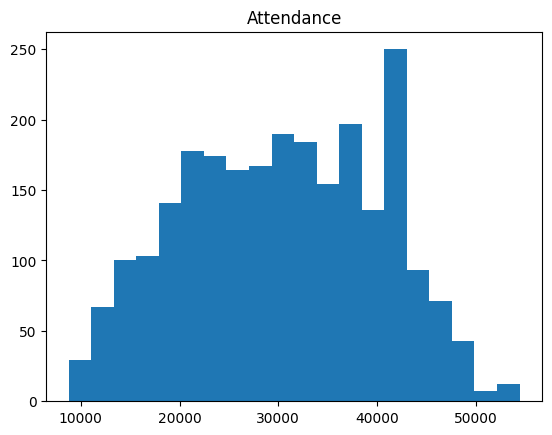

In [221]:
# Attendance: Cuantitativa discreta (Histograma)
plt.hist(datos['attendance'], bins=20)
plt.title('Attendance')
plt.show()

In [222]:
# Away team: Categoria (Tabla de frecuencias)
datos['away_team'].value_counts()

away_team
Chicago Cubs                     90
Cleveland Indians                87
Los Angeles Dodgers              87
Toronto Blue Jays                85
San Francisco Giants             84
Boston Red Sox                   83
Washington Nationals             83
Baltimore Orioles                82
Texas Rangers                    82
Cincinnati Reds                  81
New York Yankees                 81
New York Mets                    81
Arizona Diamondbacks             81
Milwaukee Brewers                81
Kansas City Royals               81
Oakland Athletics                81
Pittsburgh Pirates               81
Los Angeles Angels of Anaheim    81
Miami Marlins                    81
Philadelphia Phillies            81
San Diego Padres                 81
Detroit Tigers                   81
Houston Astros                   81
Chicago White Sox                81
St. Louis Cardinals              81
Seattle Mariners                 81
Colorado Rockies                 81
Minnesota Twins   

#### away_team_errors
Distribución geometrica

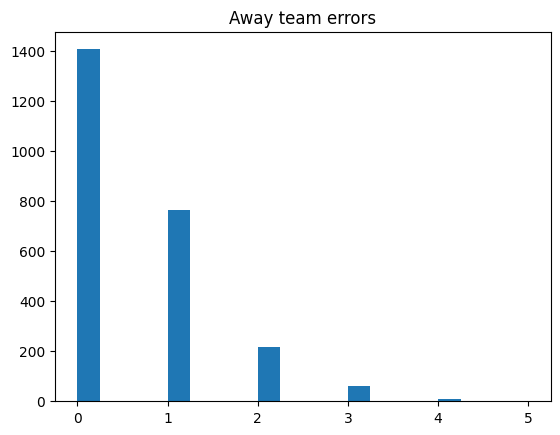

In [223]:
# away_team_errors: Cuantitativa discreta (Histograma)
plt.hist(datos['away_team_errors'], bins=20)
plt.title('Away team errors')
plt.show()

#### away_team_hits
Distribución normal

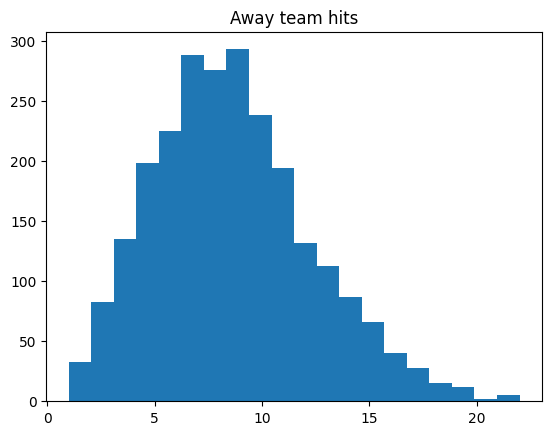

In [224]:
# away_team_hits: Cuantitativa discreta (Histograma)
plt.hist(datos['away_team_hits'], bins=20)
plt.title('Away team hits')
plt.show()

#### away_team_runs
Distribución exponencial

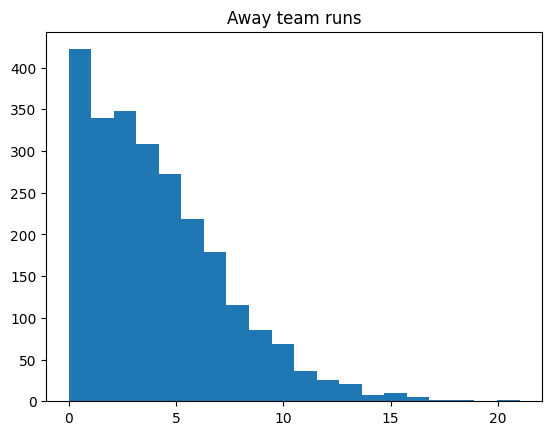

In [225]:
# away_team_runs: Cuantitativa discreta (Histograma)
plt.hist(datos['away_team_runs'], bins=20)
plt.title('Away team runs')
plt.show()

In [226]:
# boxscore_url: Categoria (Tabla de frecuencias)
datos['boxscore_url'].value_counts()

boxscore_url
https://www.baseball-reference.com/boxes/KCA/KCA201604030.shtml    1
https://www.baseball-reference.com/boxes/NYN/NYN201606140.shtml    1
https://www.baseball-reference.com/boxes/WAS/WAS201606140.shtml    1
https://www.baseball-reference.com/boxes/TOR/TOR201606140.shtml    1
https://www.baseball-reference.com/boxes/TBA/TBA201606140.shtml    1
                                                                  ..
https://www.baseball-reference.com/boxes/NYA/NYA201608270.shtml    1
https://www.baseball-reference.com/boxes/MIL/MIL201608270.shtml    1
https://www.baseball-reference.com/boxes/MIA/MIA201608270.shtml    1
https://www.baseball-reference.com/boxes/LAN/LAN201608270.shtml    1
https://www.baseball-reference.com/boxes/CLE/CLE201604060.shtml    1
Name: count, Length: 2463, dtype: int64

#### date
Distribución Uniforme

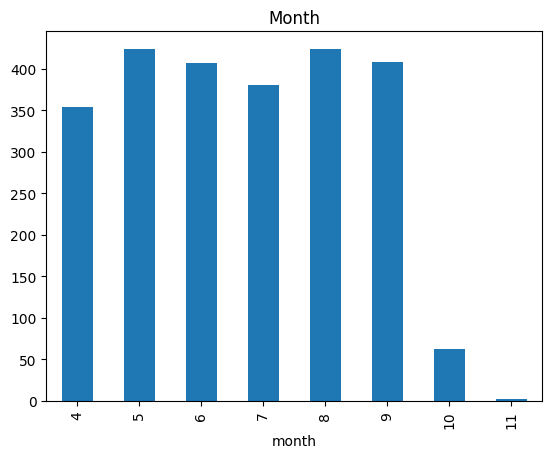

In [227]:
# date: Cuantitativa Ordinal (Barras)
datos['date'] = pd.to_datetime(datos['date'])
datos['month'] = datos['date'].dt.month
datos['month'].value_counts().sort_index().plot(kind='bar')
plt.title('Month')
plt.show()


#### game_duration

Distribución normal

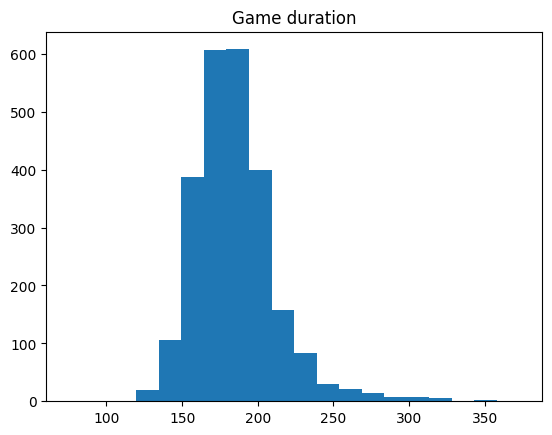

In [228]:
# game_duration: Cuantitativa discreta (Histograma)
plt.hist(datos['game_duration'], bins=20)
plt.title('Game duration')
plt.show()

In [229]:
# game_type: Categoria (Tabla de frecuencias)
datos['game_type'].value_counts()

game_type
Night Game, on grass    1560
Day Game, on grass       733
Night Game, on turf      104
Day Game, on turf         63
Name: count, dtype: int64

In [230]:
# home_team: Categoria (Tabla de frecuencias)
datos['home_team'].value_counts()

home_team
Cleveland Indians                89
Chicago Cubs                     89
Los Angeles Dodgers              86
Toronto Blue Jays                86
Washington Nationals             84
Texas Rangers                    83
San Francisco Giants             83
New York Mets                    82
Boston Red Sox                   82
Cincinnati Reds                  81
Chicago White Sox                81
St. Louis Cardinals              81
Colorado Rockies                 81
Houston Astros                   81
Minnesota Twins                  81
Kansas City Royals               81
Philadelphia Phillies            81
Seattle Mariners                 81
Milwaukee Brewers                81
New York Yankees                 81
Oakland Athletics                81
Pittsburgh Pirates               81
San Diego Padres                 81
Tampa Bay Rays                   81
Arizona Diamondbacks             81
Atlanta Braves                   81
Baltimore Orioles                81
Los Angeles Angels

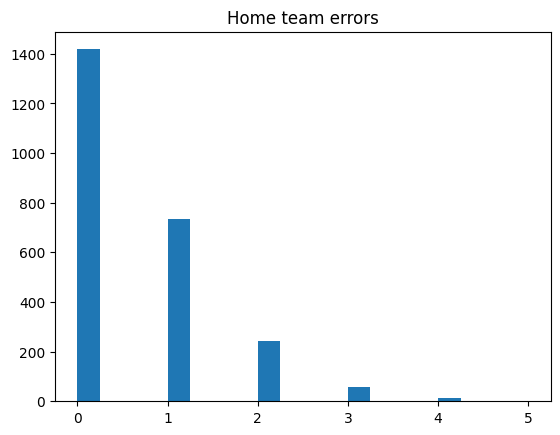

In [231]:
# home_team_errors: Cuantitativa discreta (Histograma)
plt.hist(datos['home_team_errors'], bins=20)
plt.title('Home team errors')
plt.show()

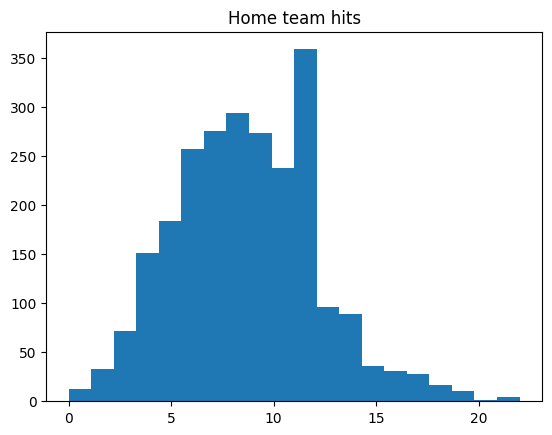

In [232]:
# home_team_hits: Cuantitativa discreta (Histograma)
plt.hist(datos['home_team_hits'], bins=20)
plt.title('Home team hits')
plt.show()

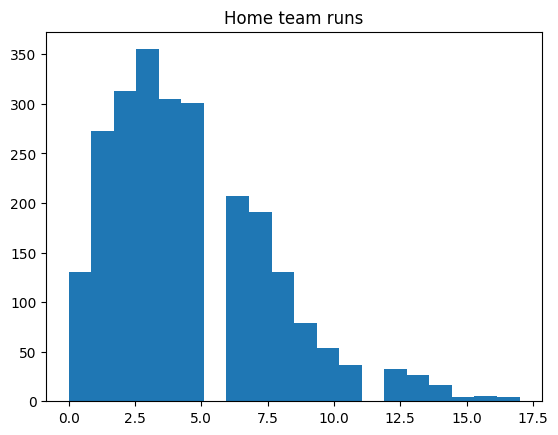

In [233]:
# home_team_runs: Cuantitativa discreta (Histograma)
plt.hist(datos['home_team_runs'], bins=20)
plt.title('Home team runs')
plt.show()

In [234]:
# start_time: Cuantitativa Ordinal (Barras)
datos['start_time'].value_counts()

start_time
07:10:00    413
07:11:00    213
07:07:00    195
07:08:00    138
01:10:00    121
           ... 
08:30:00      1
01:50:00      1
12:07:00      1
04:33:00      1
04:57:00      1
Name: count, Length: 207, dtype: int64

In [235]:
# venue: Categoria (Tabla de frecuencias)
datos['venue'].value_counts()

venue
: Progressive Field                  89
: Wrigley Field                      89
: Dodger Stadium                     86
: Rogers Centre                      86
: Nationals Park                     84
: Globe Life Park in Arlington       83
: AT&T Park                          83
: Fenway Park                        82
: Kauffman Stadium                   81
: Citi Field                         81
: Angel Stadium of Anaheim           81
: Busch Stadium III                  81
: Coors Field                        81
: Great American Ball Park           81
: Target Field                       81
: Minute Maid Park                   81
: Citizens Bank Park                 81
: Tropicana Field                    81
: Oriole Park at Camden Yards        81
: Miller Park                        81
: Yankee Stadium III                 81
: Oakland-Alameda County Coliseum    81
: Chase Field                        81
: Petco Park                         81
: Safeco Field                    

### Parte 2

In [236]:
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,field_type,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,other_info_string,start_time,venue,month
0,40030.0,New York Mets,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,2016-04-03,NaN,193.0,"Night Game, on grass",Kansas City Royals,0,9,4,"<!-- \n <div class=""section_content"" id=""d...",07:38:00,: Kauffman Stadium,4
1,21621.0,Philadelphia Phillies,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,2016-04-06,NaN,143.0,"Night Game, on grass",Cincinnati Reds,0,8,3,"<!-- \n <div class=""section_content"" id=""d...",07:11:00,: Great American Ball Park,4
2,12622.0,Minnesota Twins,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,2016-04-06,NaN,191.0,"Night Game, on grass",Baltimore Orioles,0,9,4,"<!-- \n <div class=""section_content"" id=""d...",07:07:00,: Oriole Park at Camden Yards,4
3,18531.0,Washington Nationals,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,2016-04-06,NaN,173.0,"Night Game, on grass",Atlanta Braves,1,8,1,"<!-- \n <div class=""section_content"" id=""d...",07:10:00,: Turner Field,4
4,18572.0,Colorado Rockies,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,2016-04-06,NaN,159.0,"Day Game, on grass",Arizona Diamondbacks,0,8,3,"<!-- \n <div class=""section_content"" id=""d...",12:40:00,: Chase Field,4


In [237]:
datos.dtypes

attendance                  float64
away_team                    object
away_team_errors              int64
away_team_hits                int64
away_team_runs                int64
boxscore_url                 object
date                 datetime64[ns]
field_type                  float64
game_duration               float64
game_type                    object
home_team                    object
home_team_errors              int64
home_team_hits                int64
home_team_runs                int64
other_info_string            object
start_time                   object
venue                        object
month                         int32
dtype: object

#### Eliminar las columnas que no son de interés

In [238]:
datos = datos.drop(columns=['other_info_string'])
datos = datos.drop(columns=['boxscore_url'])
datos = datos.drop(columns=['field_type'])

In [239]:
# Después de limpiar los datos
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,date,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,start_time,venue,month
0,40030.0,New York Mets,1,7,3,2016-04-03,193.0,"Night Game, on grass",Kansas City Royals,0,9,4,07:38:00,: Kauffman Stadium,4
1,21621.0,Philadelphia Phillies,0,5,2,2016-04-06,143.0,"Night Game, on grass",Cincinnati Reds,0,8,3,07:11:00,: Great American Ball Park,4
2,12622.0,Minnesota Twins,0,5,2,2016-04-06,191.0,"Night Game, on grass",Baltimore Orioles,0,9,4,07:07:00,: Oriole Park at Camden Yards,4
3,18531.0,Washington Nationals,0,8,3,2016-04-06,173.0,"Night Game, on grass",Atlanta Braves,1,8,1,07:10:00,: Turner Field,4
4,18572.0,Colorado Rockies,1,8,4,2016-04-06,159.0,"Day Game, on grass",Arizona Diamondbacks,0,8,3,12:40:00,: Chase Field,4


In [240]:
X = datos.copy()
X = X.drop(columns=['attendance'])
y = datos.copy()
y = y['attendance']


In [241]:
print(X.head())

               away_team  away_team_errors  away_team_hits  away_team_runs  \
0          New York Mets                 1               7               3   
1  Philadelphia Phillies                 0               5               2   
2        Minnesota Twins                 0               5               2   
3   Washington Nationals                 0               8               3   
4       Colorado Rockies                 1               8               4   

        date  game_duration             game_type             home_team  \
0 2016-04-03          193.0  Night Game, on grass    Kansas City Royals   
1 2016-04-06          143.0  Night Game, on grass       Cincinnati Reds   
2 2016-04-06          191.0  Night Game, on grass     Baltimore Orioles   
3 2016-04-06          173.0  Night Game, on grass        Atlanta Braves   
4 2016-04-06          159.0    Day Game, on grass  Arizona Diamondbacks   

   home_team_errors  home_team_hits  home_team_runs start_time  \
0             

In [242]:
print(y)

0       40030.0
1       21621.0
2       12622.0
3       18531.0
4       18572.0
         ...   
2458    31042.0
2459    39500.0
2460    20098.0
2461    17883.0
2462    10298.0
Name: attendance, Length: 2463, dtype: float64


## Regresión lineal simple

#### Dividir el conjunto de datos en un conjunto para entrenamiento y otro para prueba

In [243]:
X['game_duration'].fillna(X['game_duration'].mean(), inplace=True)
y.fillna(y.mean(), inplace=True)


C:\Users\marka\AppData\Local\Temp\ipykernel_2352\1594302505.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X['game_duration'].fillna(X['game_duration'].mean(), inplace=True)


In [244]:
X_simple = X.copy()
y_simple = y.copy()

print(len(X_simple))
print(len(y_simple))

2463
2463


In [245]:
X_simple.head()

,away_team,away_team_errors,away_team_hits,away_team_runs,date,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,start_time,venue,month
0,New York Mets,1,7,3,2016-04-03,193.0,"Night Game, on grass",Kansas City Royals,0,9,4,07:38:00,: Kauffman Stadium,4
1,Philadelphia Phillies,0,5,2,2016-04-06,143.0,"Night Game, on grass",Cincinnati Reds,0,8,3,07:11:00,: Great American Ball Park,4
2,Minnesota Twins,0,5,2,2016-04-06,191.0,"Night Game, on grass",Baltimore Orioles,0,9,4,07:07:00,: Oriole Park at Camden Yards,4
3,Washington Nationals,0,8,3,2016-04-06,173.0,"Night Game, on grass",Atlanta Braves,1,8,1,07:10:00,: Turner Field,4
4,Colorado Rockies,1,8,4,2016-04-06,159.0,"Day Game, on grass",Arizona Diamondbacks,0,8,3,12:40:00,: Chase Field,4


In [246]:
X_simple.drop(columns=['away_team'], inplace=True)
X_simple.drop(columns=['date'], inplace=True)
X_simple.drop(columns=['home_team'], inplace=True)
X_simple.drop(columns=['start_time'], inplace=True)
X_simple.drop(columns=['venue'], inplace=True)
X_simple.drop(columns=['game_type'], inplace=True)

In [247]:
X_simple.head()

,away_team_errors,away_team_hits,away_team_runs,game_duration,home_team_errors,home_team_hits,home_team_runs,month
0,1,7,3,193.0,0,9,4,4
1,0,5,2,143.0,0,8,3,4
2,0,5,2,191.0,0,9,4,4
3,0,8,3,173.0,1,8,1,4
4,1,8,4,159.0,0,8,3,4


In [248]:
X_simple.isnull().sum()

X_simple['game_duration'].fillna(X_simple['game_duration'].mean(), inplace=True)
y_simple.fillna(y_simple.mean(), inplace=True)

y_simple = y_simple.to_numpy()

C:\Users\marka\AppData\Local\Temp\ipykernel_2352\3530800304.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_simple['game_duration'].fillna(X_simple['game_duration'].mean(), inplace=True)


In [249]:
X_simple = X_simple.iloc[:, 0:].values

In [250]:
print(X_simple)

[[ 1.  7.  3. ...  9.  4.  4.]
 [ 0.  5.  2. ...  8.  3.  4.]
 [ 0.  5.  2. ...  9.  4.  4.]
 ...
 [ 0.  6.  3. ...  9.  4.  4.]
 [ 0. 13.  7. ... 10.  3.  4.]
 [ 1. 10.  6. ...  9.  7.  4.]]


In [251]:
print(len(X_simple))
print(len(y_simple))

2463
2463


In [252]:
from sklearn.model_selection import train_test_split

X_e_simple, X_p_simple, y_e_simple, y_p_simple = train_test_split(X_simple, y_simple, test_size = 0.2, random_state = 0)

In [253]:
print(len(X_e_simple))
print(len(y_e_simple))
print (len(X_p_simple))
print(len(y_p_simple))

1970
1970
493
493


In [254]:
from sklearn.linear_model import LinearRegression
regresor = LinearRegression()
regresor.fit(X_e_simple, y_e_simple)

LinearRegression()

In [255]:
y_pred = regresor.predict(X_p_simple)

In [256]:
# print sizes of y
print(len(X_p_simple))
print(len(y_pred))

493
493


In [257]:
regresor.score(X_p_simple, y_p_simple)

0.005533352670327063

In [258]:
print(len(X_p_simple))
print(len(y_p_simple))

493
493


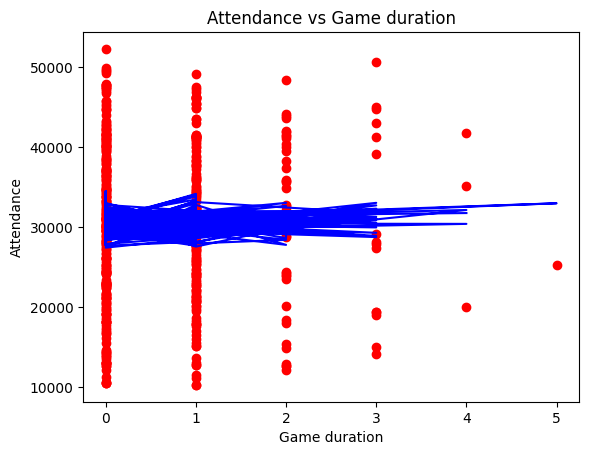

In [259]:
plt.scatter(X_p_simple[:, 0], y_p_simple, color = 'red')
plt.plot(X_p_simple[:, 0], regresor.predict(X_p_simple), color = 'blue')
plt.title('Attendance vs Game duration')
plt.xlabel('Game duration')
plt.ylabel('Attendance')
plt.show()

## Regresión Lineal Multiple


In [260]:
X_mult = X.copy()
y_mult = y.copy()

In [261]:
X_mult.head()

,away_team,away_team_errors,away_team_hits,away_team_runs,date,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,start_time,venue,month
0,New York Mets,1,7,3,2016-04-03,193.0,"Night Game, on grass",Kansas City Royals,0,9,4,07:38:00,: Kauffman Stadium,4
1,Philadelphia Phillies,0,5,2,2016-04-06,143.0,"Night Game, on grass",Cincinnati Reds,0,8,3,07:11:00,: Great American Ball Park,4
2,Minnesota Twins,0,5,2,2016-04-06,191.0,"Night Game, on grass",Baltimore Orioles,0,9,4,07:07:00,: Oriole Park at Camden Yards,4
3,Washington Nationals,0,8,3,2016-04-06,173.0,"Night Game, on grass",Atlanta Braves,1,8,1,07:10:00,: Turner Field,4
4,Colorado Rockies,1,8,4,2016-04-06,159.0,"Day Game, on grass",Arizona Diamondbacks,0,8,3,12:40:00,: Chase Field,4


In [262]:
# Xmult only to have home team
X_mult = X_mult[['home_team', 'game_duration']]
X_mult.head()

,home_team,game_duration
0,Kansas City Royals,193.0
1,Cincinnati Reds,143.0
2,Baltimore Orioles,191.0
3,Atlanta Braves,173.0
4,Arizona Diamondbacks,159.0


In [263]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
transCol = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [0])], remainder='passthrough')
X_mult = transCol.fit_transform(X_mult)

In [264]:
X_mult.shape

(2463, 31)

In [265]:
from sklearn.model_selection import train_test_split
X_e_mult, X_p_mult, y_e_mult, y_p_mult = train_test_split(X_mult, y_mult, test_size = 0.2, random_state = 0)

In [266]:
from sklearn.linear_model import LinearRegression
regresor = LinearRegression()
regresor.fit(X_e_mult, y_e_mult)

LinearRegression()

In [267]:
y_pred_mult = regresor.predict(X_p_mult)

In [268]:
regresor.score(X_p_mult, y_p_mult)

0.5886305239676155

## Regresión polinomial

In [269]:
X_polinomial = X.copy()
y_polinomial = y.copy()

In [270]:
X_polinomial.head()

,away_team,away_team_errors,away_team_hits,away_team_runs,date,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,start_time,venue,month
0,New York Mets,1,7,3,2016-04-03,193.0,"Night Game, on grass",Kansas City Royals,0,9,4,07:38:00,: Kauffman Stadium,4
1,Philadelphia Phillies,0,5,2,2016-04-06,143.0,"Night Game, on grass",Cincinnati Reds,0,8,3,07:11:00,: Great American Ball Park,4
2,Minnesota Twins,0,5,2,2016-04-06,191.0,"Night Game, on grass",Baltimore Orioles,0,9,4,07:07:00,: Oriole Park at Camden Yards,4
3,Washington Nationals,0,8,3,2016-04-06,173.0,"Night Game, on grass",Atlanta Braves,1,8,1,07:10:00,: Turner Field,4
4,Colorado Rockies,1,8,4,2016-04-06,159.0,"Day Game, on grass",Arizona Diamondbacks,0,8,3,12:40:00,: Chase Field,4


In [271]:
X_polinomial = X_polinomial.drop(columns=['away_team', 'date', 'start_time', 'venue', 'game_type'])
X_polinomial.head()

,away_team_errors,away_team_hits,away_team_runs,game_duration,home_team,home_team_errors,home_team_hits,home_team_runs,month
0,1,7,3,193.0,Kansas City Royals,0,9,4,4
1,0,5,2,143.0,Cincinnati Reds,0,8,3,4
2,0,5,2,191.0,Baltimore Orioles,0,9,4,4
3,0,8,3,173.0,Atlanta Braves,1,8,1,4
4,1,8,4,159.0,Arizona Diamondbacks,0,8,3,4


In [272]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

transCol = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [4])], remainder='passthrough')
X_polinomial = transCol.fit_transform(X_polinomial)

In [273]:
print(X_polinomial.shape)

(2463, 38)


In [274]:
from sklearn.model_selection import train_test_split
X_e_poli, X_p_poli, y_e_poli, y_p_poli = train_test_split(X_polinomial, y_polinomial, test_size = 0.2, random_state = 0)

In [275]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
poly_reg = PolynomialFeatures(degree = 4)
X_poli = poly_reg.fit_transform(X_e_poli)
regresor = LinearRegression()
regresor.fit(X_poli, y_e_poli)

KeyboardInterrupt: 

In [ ]:
regresor.score(poly_reg.transform(X_p_poli), y_p_poli)

0.45684805906182135

In [ ]:
# coeficientes
print(regresor.coef_)

[ 6.52499149e-22 -2.64102398e-07 -2.37484922e-07 ... -8.34109739e-05
 -3.86150177e-04 -6.31031144e-04]


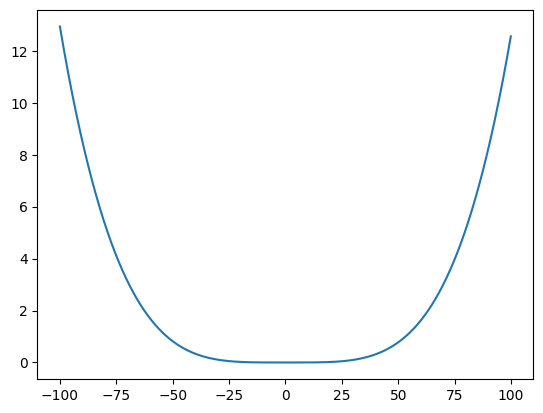

In [ ]:
# graficar la función en base a los coeficientes
x = np.arange(-100, 100, 0.1)
y = regresor.coef_[0] + regresor.coef_[1]*x + regresor.coef_[2]*x**2 + regresor.coef_[3]*x**3 + regresor.coef_[4]*x**4
plt.plot(x, y)
plt.show()

## SVR

In [284]:
X_svr = X.copy()
y_svr = y.copy()

In [285]:
X_svr = X_svr.drop(columns=['away_team', 'date', 'start_time', 'venue', 'game_type'])
X_svr.head()

,away_team_errors,away_team_hits,away_team_runs,game_duration,home_team,home_team_errors,home_team_hits,home_team_runs,month
0,1,7,3,193.0,Kansas City Royals,0,9,4,4
1,0,5,2,143.0,Cincinnati Reds,0,8,3,4
2,0,5,2,191.0,Baltimore Orioles,0,9,4,4
3,0,8,3,173.0,Atlanta Braves,1,8,1,4
4,1,8,4,159.0,Arizona Diamondbacks,0,8,3,4


In [286]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

transCol = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [4])], remainder='passthrough')
X_svr = transCol.fit_transform(X_svr)

In [287]:
print(X_svr.shape)

(2463, 38)


In [288]:
from sklearn.preprocessing import StandardScaler

sc_X = StandardScaler(with_mean=False)
sc_y = StandardScaler()

X_svr = sc_X.fit_transform(X_svr)
y_svr = sc_y.fit_transform(y_svr.values.reshape(-1, 1))

In [289]:
print(X_svr)

  (0, 11)	5.607264256764681
  (0, 30)	1.2606689497349335
  (0, 31)	1.99380885652658
  (0, 32)	0.9665179724705469
  (0, 33)	6.988242627630591
  (0, 35)	2.6191212720265034
  (0, 36)	1.2857847390171404
  (0, 37)	2.2726977995189017
  (1, 6)	5.607264256764681
  (1, 31)	1.4241491832332716
  (1, 32)	0.6443453149803646
  (1, 33)	5.177817076430955
  (1, 35)	2.3281077973568918
  (1, 36)	0.9643385542628553
  (1, 37)	2.2726977995189017
  (2, 2)	5.607264256764681
  (2, 31)	1.4241491832332716
  (2, 32)	0.6443453149803646
  (2, 33)	6.915825605582604
  (2, 35)	2.6191212720265034
  (2, 36)	1.2857847390171404
  (2, 37)	2.2726977995189017
  (3, 1)	5.607264256764681
  (3, 31)	2.2786386931732343
  (3, 32)	0.9665179724705469
  :	:
  (2459, 37)	2.2726977995189017
  (2460, 15)	5.607264256764681
  (2460, 31)	1.7089790198799257
  (2460, 32)	0.9665179724705469
  (2460, 33)	7.205493693774546
  (2460, 34)	2.4833032961808192
  (2460, 35)	2.6191212720265034
  (2460, 36)	1.2857847390171404
  (2460, 37)	2.272697799518

In [290]:
from sklearn.model_selection import train_test_split

X_e_svr, X_p_svr, y_e_svr, y_p_svr = train_test_split(X_svr, y_svr, test_size = 0.2, random_state = 0)

In [291]:
from sklearn.svm import SVR
regresor = SVR()
regresor.fit(X_e_svr, y_e_svr)

c:\Users\marka\anaconda3\envs\DataMining11\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR()

In [292]:
y_pred_svr = regresor.predict(X_p_svr)

In [293]:
from sklearn.metrics import r2_score

r2_score(y_p_svr, y_pred_svr)

0.5819398809415416

## Árbol de decisión

In [300]:
X_dt = X.copy()
y_dt = y.copy()

In [301]:
print(X_dt)
print(y_dt)


                  away_team  away_team_errors  away_team_hits  away_team_runs  \
0             New York Mets                 1               7               3   
1     Philadelphia Phillies                 0               5               2   
2           Minnesota Twins                 0               5               2   
3      Washington Nationals                 0               8               3   
4          Colorado Rockies                 1               8               4   
...                     ...               ...             ...             ...   
2458      Toronto Blue Jays                 2               7               5   
2459    St. Louis Cardinals                 0               5               1   
2460   San Francisco Giants                 0               6               3   
2461         Detroit Tigers                 0              13               7   
2462         Boston Red Sox                 1              10               6   

           date  game_durat

In [302]:
X_dt = X_dt.drop(columns=['away_team', 'date', 'start_time', 'venue', 'game_type'])
X_dt.head()

,away_team_errors,away_team_hits,away_team_runs,game_duration,home_team,home_team_errors,home_team_hits,home_team_runs,month
0,1,7,3,193.0,Kansas City Royals,0,9,4,4
1,0,5,2,143.0,Cincinnati Reds,0,8,3,4
2,0,5,2,191.0,Baltimore Orioles,0,9,4,4
3,0,8,3,173.0,Atlanta Braves,1,8,1,4
4,1,8,4,159.0,Arizona Diamondbacks,0,8,3,4


In [303]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

transCol = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [4])], remainder='passthrough')
X_dt = transCol.fit_transform(X_dt)

In [304]:
from sklearn.model_selection import train_test_split
X_e_dt, X_p_dt, y_e_dt, y_p_dt = train_test_split(X_dt, y_dt, test_size = 0.2, random_state = 0)

In [305]:
from sklearn.tree import DecisionTreeRegressor
regresor = DecisionTreeRegressor(random_state = 0)
regresor.fit(X_e_dt, y_e_dt)

DecisionTreeRegressor(random_state=0)

In [306]:
y_pred_dt = regresor.predict(X_p_dt)

In [307]:
from sklearn.metrics import r2_score
r2_score(y_p_dt, y_pred_dt)

0.27391753182141076